# Song Vocal Extraction

## Imports

In [60]:
import os
import time

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import librosa
import librosa.display
from IPython.display import Audio
import stempeg
import soundfile as sf

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

## Grabbing Data

In [61]:
path = "./data/"
song_names = os.listdir(path)
print(len(song_names))

150


## Understanding Data Format

In [62]:
def getSongStems(path, new_sr):
    x, sr = stempeg.read_stems(path, stem_id=[0, 4])
    x = (x[:, :, 0] + x[:, :, 1]) / 2.0
    x = librosa.resample(x, orig_sr=sr, target_sr=new_sr)
    return x, new_sr

In [63]:
file_path = path + song_names[0]
x, sr = getSongStems(file_path, 8192)

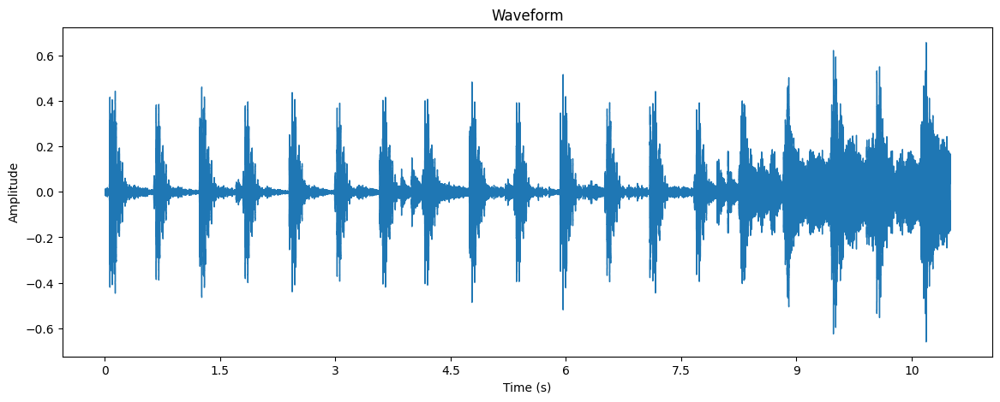

In [64]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x[0, sr * 5 : sr * 16], sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

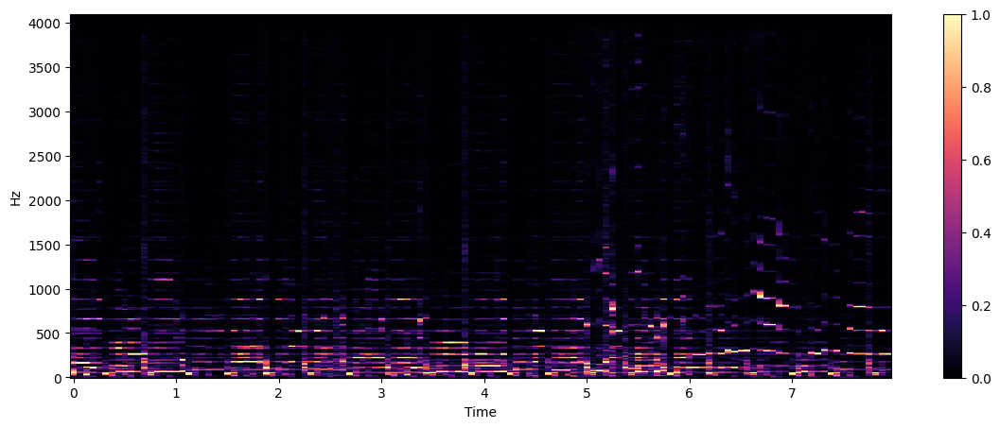

In [65]:
plt.figure(figsize=(14, 5))
db_spec = abs(librosa.stft(x[0, sr*24:sr * 36], n_fft=1024, win_length = 1024, hop_length = 768))[:-1, :-1]
scaler = MinMaxScaler()
db_spec = scaler.fit_transform(db_spec)
librosa.display.specshow(db_spec, sr=sr, x_axis = "time", y_axis = "hz", cmap='magma')
plt.colorbar()

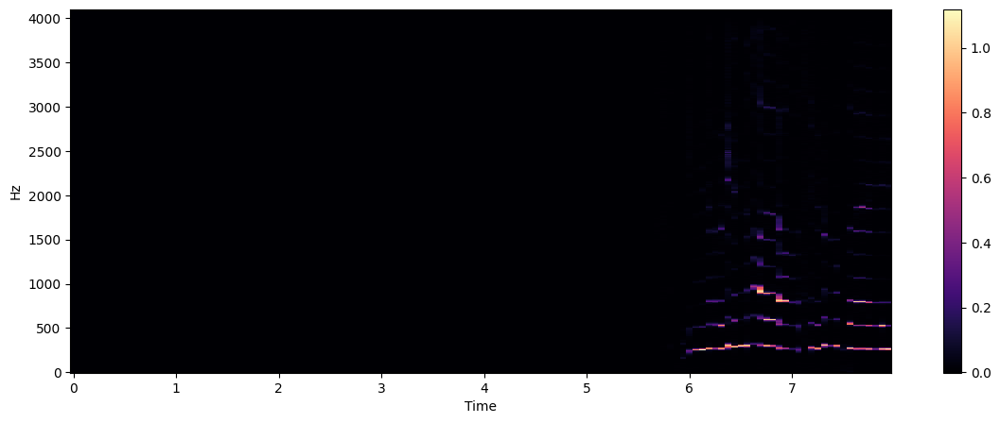

In [66]:
plt.figure(figsize=(14, 5))
db_spec_v = abs(librosa.stft(x[1, sr*24:sr * 36], n_fft=1024, win_length = 1024, hop_length = 768))[:-1, :-1]
db_spec_v = scaler.transform(db_spec_v)
librosa.display.specshow(db_spec_v, sr=sr, x_axis = "time", y_axis = "hz", cmap='magma')
plt.colorbar()

In [67]:
db_spec.shape

(512, 128)

### Playing Full Song

In [68]:
Audio(x[0], rate=sr)

### Playing Isolated Audio

In [69]:
Audio(x[1], rate=sr)

## Data Preparation

### Split Data Into 12 Second Clips

In [70]:
def get_clips(song_name, path, output_dir, new_sr = 8192, segment_duration = 12):
    x, sr = getSongStems(path + song_name, new_sr)
    num_segments = int(len(x[0]) / (segment_duration * sr))
    
    if not os.path.exists(output_dir + "mixtures/"):
        os.makedirs(output_dir + "mixtures/")

    if not os.path.exists(output_dir + "vocals/"):
        os.makedirs(output_dir + "vocals/")
        
    for i in range(num_segments):
        start_sample = i * segment_duration * sr
        end_sample = (i + 1) * segment_duration * sr
        mixture_segment = x[0, start_sample:end_sample]
        vocal_segment = x[1, start_sample:end_sample]
        mixture_output_path = os.path.join(output_dir + "mixtures/", f"{song_name}_segment_{i}.wav")
        vocal_output_path = os.path.join(output_dir + "vocals/", f"{song_name}_segment_{i}.wav")
        sf.write(mixture_output_path, mixture_segment, sr)
        sf.write(vocal_output_path, vocal_segment, sr)

#### Train Test Split Before Creating 12 Second Segments

In [24]:
train_songs, test_songs = train_test_split(song_names, test_size=0.2, random_state=42)

train_output_dir = "./segmented_data/train/"
for song in train_songs:
    get_clips(song, path, train_output_dir)

test_output_dir = "./segmented_data/test/"
for song in test_songs:
    get_clips(song, path, test_output_dir)

### Generate Spectrograms for each Song Segment

In [71]:
def getSpectrograms(path, sr = 8192):
    mixtures = []
    vocals = []
    scalers = []

    song_names = os.listdir(path + 'mixtures')
    for song_name in song_names:
        m, _ = librosa.load(path + 'mixtures/' + song_name, sr = sr)
        v, _ = librosa.load(path + 'vocals/' + song_name, sr = sr)
        M = abs(librosa.stft(m, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1])
        V = abs(librosa.stft(v, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1])
        scaler = MinMaxScaler()
        M = scaler.fit_transform(M)
        V = scaler.transform(V)
        mixtures.append([M])
        vocals.append([V])
        scalers.append(scaler)

    return torch.tensor(mixtures), torch.tensor(vocals), scalers

In [72]:
train_mix_specs, train_voc_specs, train_scalers = getSpectrograms("./segmented_data/train/")
test_mix_specs, test_voc_specs, test_scalers = getSpectrograms("./segmented_data/test/")

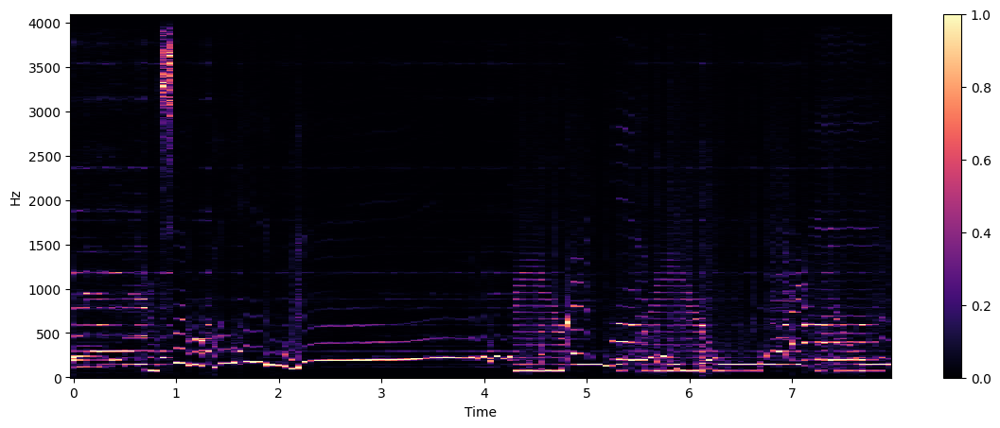

In [73]:
plt.figure(figsize = (14, 5))
librosa.display.specshow(train_mix_specs[200, 0, :, :].numpy(), sr = 8192, x_axis = "time", y_axis = "hz")
plt.colorbar()

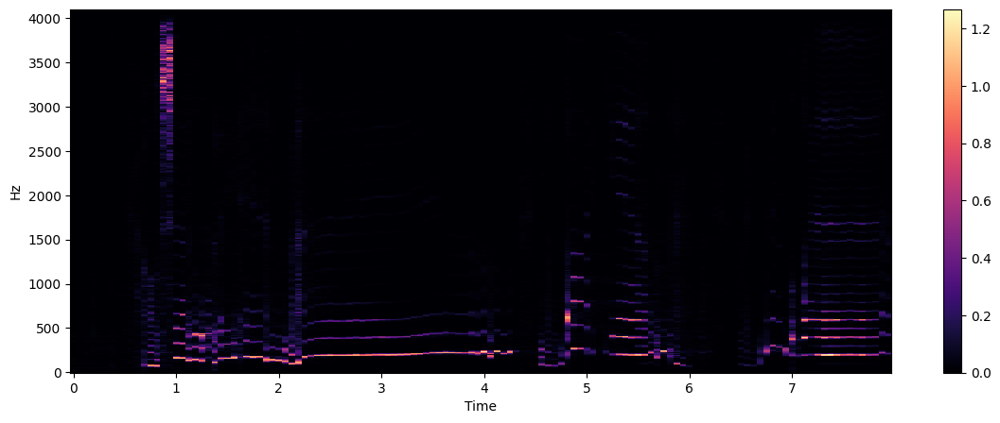

In [74]:
plt.figure(figsize = (14, 5))
librosa.display.specshow(train_voc_specs[200, 0, :, :].numpy(), sr = 8192, x_axis = "time", y_axis = "hz")
plt.colorbar()

In [75]:
train_mix_specs.shape

torch.Size([2280, 1, 512, 128])

### Creating PyTorch Database

In [76]:
class SongDataset(Dataset):
    def __init__(self, mixture, vocals):
        self.mixture = mixture
        self.vocals = vocals

    def __len__(self):
        return len(self.mixture)

    def __getitem__(self, idx):
        return self.mixture[idx, :, :], self.vocals[idx, :, :]

In [77]:
train_dataset = SongDataset(train_mix_specs, train_voc_specs)
test_dataset = SongDataset(test_mix_specs, test_voc_specs)

### Creating PyTorch DataLoaders

In [78]:
train_dl = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_dl = DataLoader(test_dataset, batch_size=16, shuffle=True)

## Defining Basic U-NET

In [79]:
class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 5, stride = 2, leakiness = 0.2):
        super(Encoder, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = kernel_size // 2),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(negative_slope = leakiness, inplace = True)
        )

    def forward(self, x):
        return self.block(x)

class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 5, stride = 2):
        super(Decoder, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = kernel_size // 2, output_padding = 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace = True)
        )

    def forward(self, x):
        return self.block(x)

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        # Encoders
        self.encoder1 = Encoder(1, 16)
        self.encoder2 = Encoder(16, 32)
        self.encoder3 = Encoder(32, 64)
        self.encoder4 = Encoder(64, 128)
        self.encoder5 = Encoder(128, 256)
        
        # Bottleneck
        self.bottleneck = Encoder(256, 512)

        # Decoders
        self.decoder5 = Decoder(512, 256)
        self.decoder4 = Decoder(512, 128)
        self.decoder3 = Decoder(256, 64)
        self.decoder2 = Decoder(128, 32)
        self.decoder1 = Decoder(64, 16)

        # Dropout
        self.dropout = nn.Dropout(p = 0.5)

        # Output
        self.mask = nn.ConvTranspose2d(32, 1, kernel_size = 5, stride = 2, padding = 2, output_padding = 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Encoders
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        enc5 = self.encoder5(enc4)
        
        # Bottleneck
        bottleneck = self.bottleneck(enc5)

        # Decoders
        dec5 = self.decoder5(bottleneck)
        dec5 = self.dropout(dec5)
        dec4 = self.decoder4(torch.cat((enc5, dec5), dim = 1))
        dec4 = self.dropout(dec4)
        dec3 = self.decoder3(torch.cat((enc4, dec4), dim = 1))
        dec3 = self.dropout(dec3)
        dec2 = self.decoder2(torch.cat((enc3, dec3), dim = 1))
        dec1 = self.decoder1(torch.cat((enc2, dec2), dim = 1))

        # Output
        mask = self.mask(torch.cat((enc1, dec1), dim = 1))
        return self.sigmoid(mask)

## Defining Training Loop

In [80]:
def save_checkpoint(model, optimizer, epoch, loss, path):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, path)
    print(f'Checkpoint saved at epoch {epoch}')

In [81]:
def train_model(model, train_loader, test_loader, num_epochs):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.train()
    criterion = nn.L1Loss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    checkpoint_path = "./checkpoints_original_model/"

    if not os.path.exists(checkpoint_path):
        os.makedirs(checkpoint_path)
    
    for epoch in range(num_epochs):
        print(f'Epoch [{epoch+1}/{num_epochs}]')
        epoch_start_time = time.time()
        running_loss = 0.0
        
        for i, data in enumerate(train_loader, 0):
            inputs, targets = data[0].to(device), data[1].to(device)
            if (i % 50 == 0):
                print(f'\tBatch progress [{i * inputs.shape[0]}/{len(train_loader) * inputs.shape[0]}]')
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs * inputs, targets)
            loss.backward()
            optimizer.step()

            if (i == 0 and epoch % 10 == 0):
                plt.figure(figsize=(12, 10))
                plt.subplot(4, 1, 1)
                plt.title('Input Spectrogram')
                librosa.display.specshow(inputs[0, 0, :, :].cpu().numpy(), sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()
            
                plt.subplot(4, 1, 2)
                plt.title('Target Spectrogram (Vocals)')
                librosa.display.specshow(targets[0, 0, :, :].cpu().numpy(), sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()

                plt.subplot(4, 1, 3)
                plt.title('Mask')
                librosa.display.specshow(outputs[0, 0, :, :].cpu().detach().numpy(), sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()
            
                plt.subplot(4, 1, 4)
                plt.title('Output Spectrogram (Predicted Vocals)')
                librosa.display.specshow((outputs[0, 0, :, :] * inputs[0, 0, :, :]).cpu().detach().numpy() , sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()
            
                plt.tight_layout()
                plt.show()
                
            running_loss += loss.item()

        epoch_end_time = time.time()
        epoch_duration = epoch_end_time - epoch_start_time
        print(f'Loss: {running_loss/len(train_loader):.4f}, runtime: {epoch_duration}')
        evaluate_model(model, test_loader)
        save_checkpoint(model, optimizer, epoch + 1, loss.item(), checkpoint_path + f"epoch_{epoch + 1}.pt")
        
    print('Finished Training')

In [82]:
def evaluate_model(model, test_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    criterion = nn.L1Loss()
    test_loss = 0.0
    
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
    
    print(f'Test Loss: {test_loss/len(test_loader):.4f}')
    model.train()

## Training Model

In [83]:
unet = UNet()

Epoch [1/60]
	Batch progress [0/2288]


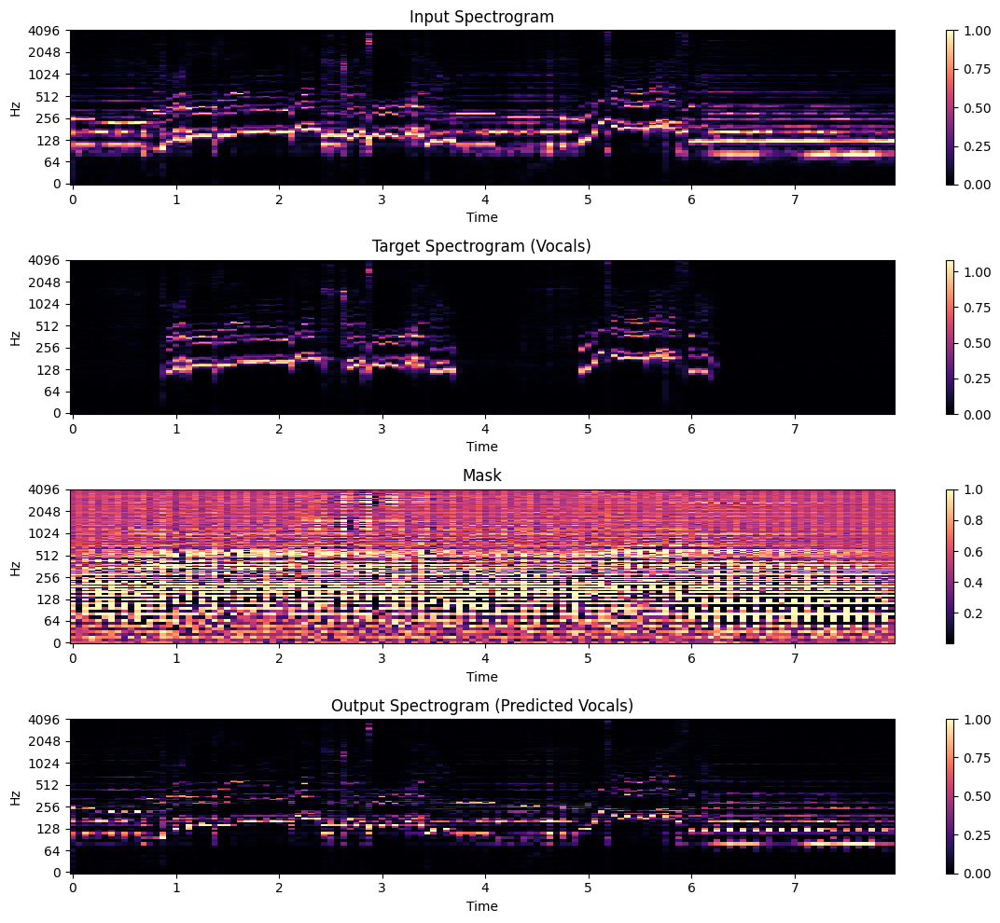

	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0129, runtime: 82.88959097862244
Test Loss: 0.0414
Checkpoint saved at epoch 1
Epoch [2/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0108, runtime: 81.09093403816223
Test Loss: 0.2270
Checkpoint saved at epoch 2
Epoch [3/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0102, runtime: 81.63095712661743
Test Loss: 0.2445
Checkpoint saved at epoch 3
Epoch [4/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0096, runtime: 83.4549171924591
Test Loss: 0.0504
Checkpoint saved at epoch 4
Epoch [5/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0093, runtime: 82.90284705162048
Test Loss: 0.1805
Checkpoint saved at epoch 5
Epoch [6/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0089, runtime: 82.69829893112183
Test 

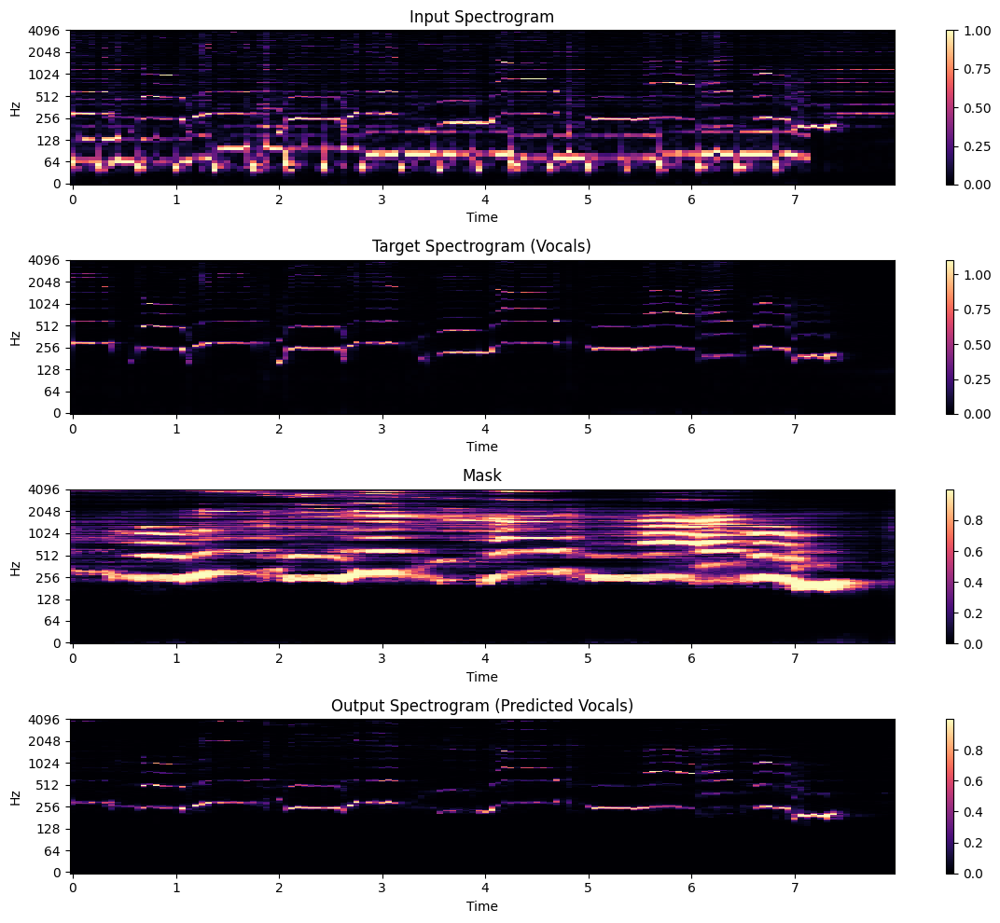

	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0079, runtime: 83.9704909324646
Test Loss: 0.1442
Checkpoint saved at epoch 11
Epoch [12/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0077, runtime: 84.45254135131836
Test Loss: 0.4316
Checkpoint saved at epoch 12
Epoch [13/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0076, runtime: 83.2129340171814
Test Loss: 0.1558
Checkpoint saved at epoch 13
Epoch [14/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0074, runtime: 85.40730404853821
Test Loss: 0.2675
Checkpoint saved at epoch 14
Epoch [15/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0075, runtime: 83.16335582733154
Test Loss: 0.1483
Checkpoint saved at epoch 15
Epoch [16/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0074, runtime: 84.21648907661

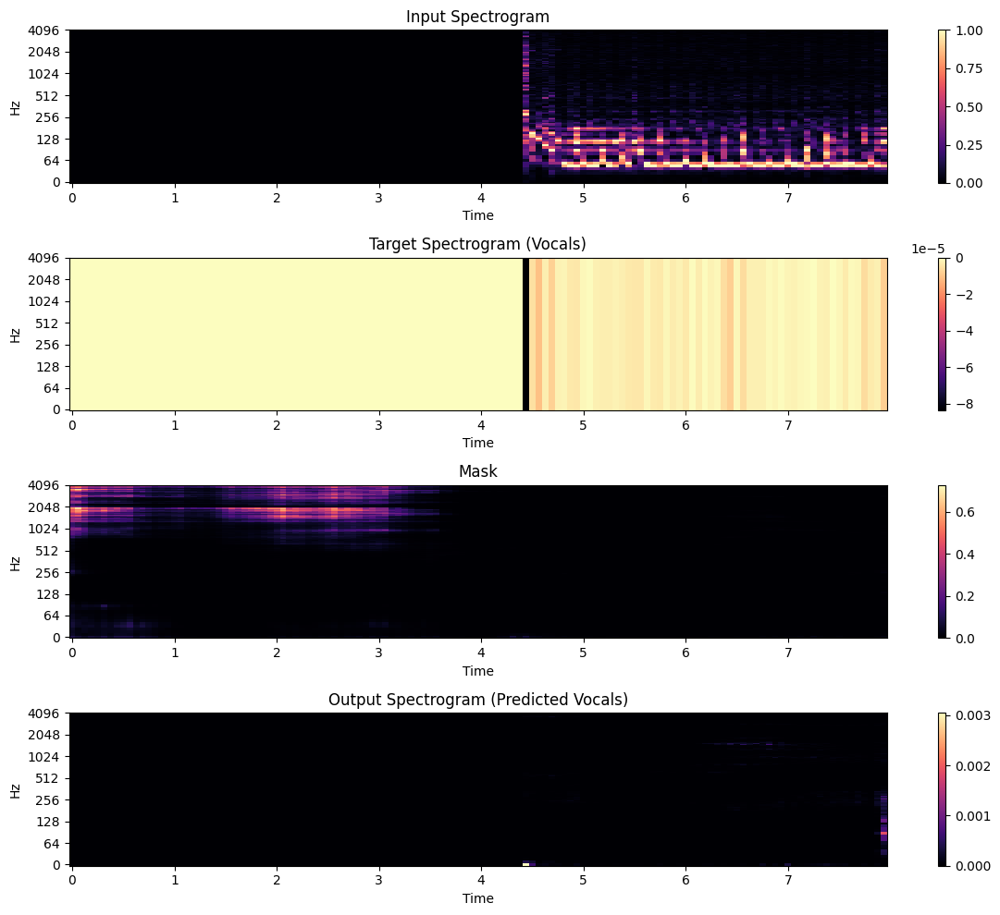

	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0069, runtime: 83.93837523460388
Test Loss: 0.2272
Checkpoint saved at epoch 21
Epoch [22/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0068, runtime: 82.4649829864502
Test Loss: 0.2002
Checkpoint saved at epoch 22
Epoch [23/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0067, runtime: 88.03445029258728
Test Loss: 0.3224
Checkpoint saved at epoch 23
Epoch [24/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0067, runtime: 99.31753087043762
Test Loss: 0.1911
Checkpoint saved at epoch 24
Epoch [25/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0066, runtime: 88.50708627700806
Test Loss: 0.2425
Checkpoint saved at epoch 25
Epoch [26/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0065, runtime: 83.1119658946

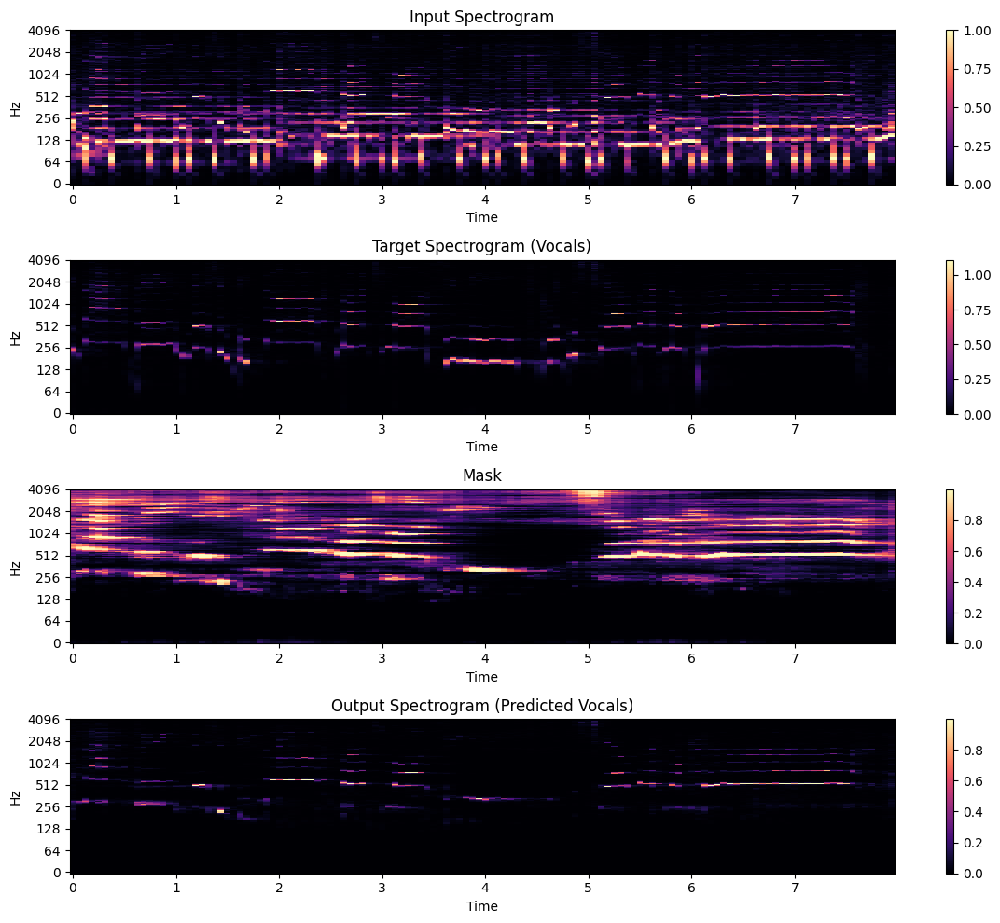

	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0063, runtime: 91.43802881240845
Test Loss: 0.1892
Checkpoint saved at epoch 31
Epoch [32/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0063, runtime: 86.27591180801392
Test Loss: 0.2192
Checkpoint saved at epoch 32
Epoch [33/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0062, runtime: 84.48006200790405
Test Loss: 0.2082
Checkpoint saved at epoch 33
Epoch [34/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0061, runtime: 83.1855731010437
Test Loss: 0.2091
Checkpoint saved at epoch 34
Epoch [35/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0061, runtime: 86.21529912948608
Test Loss: 0.2675
Checkpoint saved at epoch 35
Epoch [36/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0060, runtime: 86.0265889167

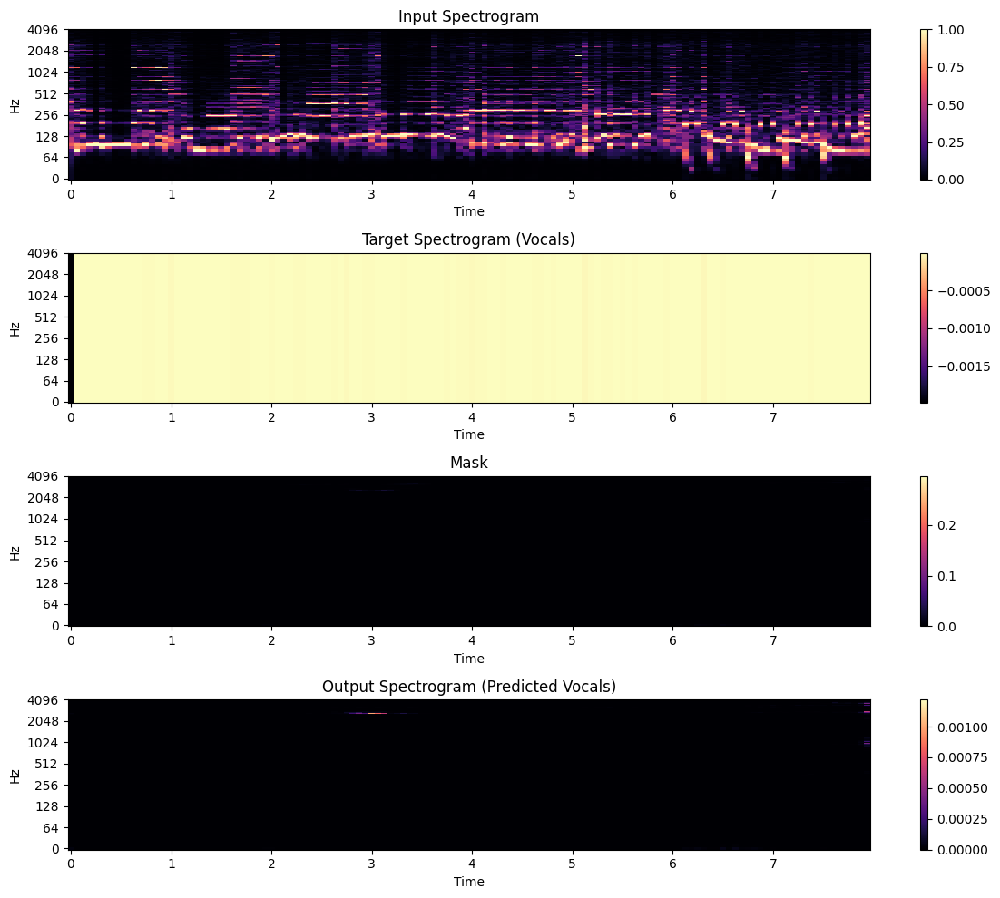

	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0059, runtime: 85.50726389884949
Test Loss: 0.2657
Checkpoint saved at epoch 41
Epoch [42/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0059, runtime: 83.56946516036987
Test Loss: 0.1740
Checkpoint saved at epoch 42
Epoch [43/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0058, runtime: 87.27870106697083
Test Loss: 0.3112
Checkpoint saved at epoch 43
Epoch [44/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0058, runtime: 85.53430414199829
Test Loss: 0.2288
Checkpoint saved at epoch 44
Epoch [45/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0057, runtime: 83.1445460319519
Test Loss: 0.2515
Checkpoint saved at epoch 45
Epoch [46/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0057, runtime: 84.8191411495

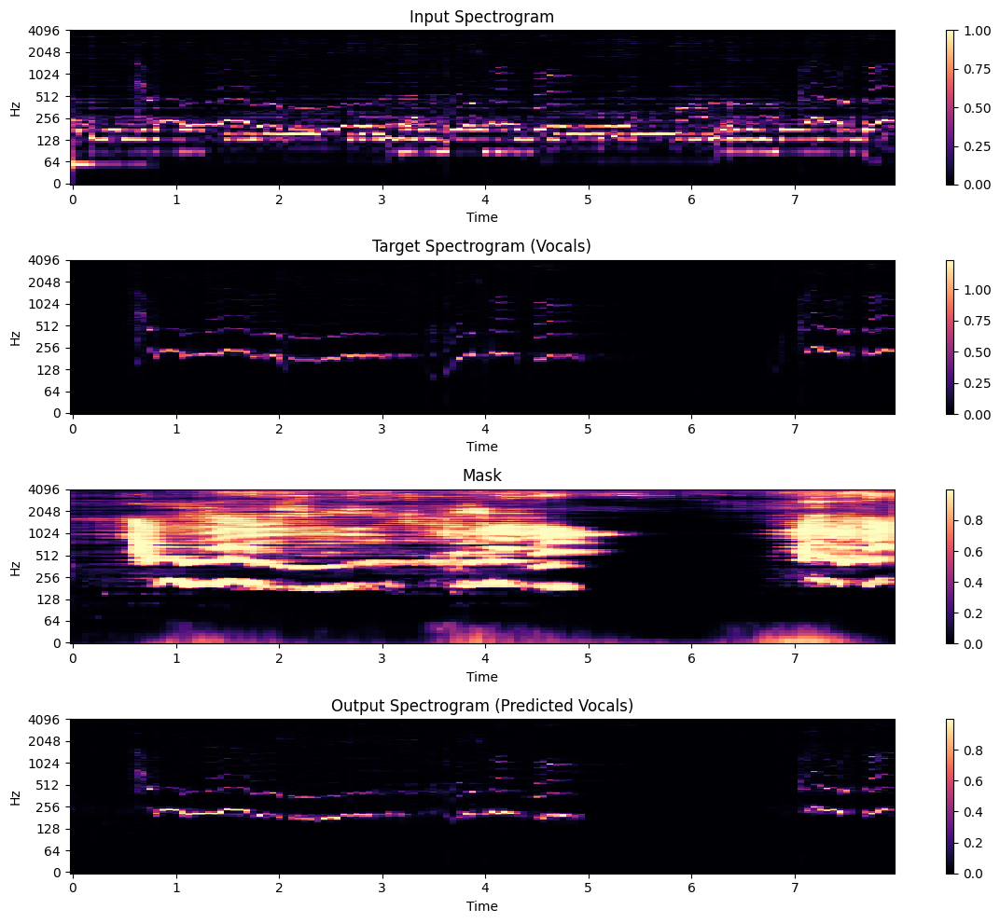

	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0056, runtime: 84.4306309223175
Test Loss: 0.2526
Checkpoint saved at epoch 51
Epoch [52/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0056, runtime: 84.09512877464294
Test Loss: 0.1938
Checkpoint saved at epoch 52
Epoch [53/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0056, runtime: 89.92504215240479
Test Loss: 0.3249
Checkpoint saved at epoch 53
Epoch [54/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0056, runtime: 92.06419110298157
Test Loss: 0.2332
Checkpoint saved at epoch 54
Epoch [55/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0055, runtime: 92.9077980518341
Test Loss: 0.2261
Checkpoint saved at epoch 55
Epoch [56/60]
	Batch progress [0/2288]
	Batch progress [800/2288]
	Batch progress [1600/2288]
Loss: 0.0055, runtime: 82.43283987045

In [51]:
train_model(unet, train_dl, test_dl, num_epochs=60)

### Choosing Best Model

In [118]:
def load_checkpoint(model, path):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    return model

unet = load_checkpoint(unet, './checkpoints_original_model/epoch_60.pt')

## Evaluating Performance

In [119]:
def get_test_data(idx):
    song_name = os.listdir('./segmented_data/test/mixtures')[idx]
    m, _ = librosa.load('./segmented_data/test/mixtures/' + song_name, sr = 8192)
    v, _ = librosa.load('./segmented_data/test/vocals/' + song_name, sr = 8192)
    M = librosa.stft(m, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1]
    V = librosa.stft(v, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1]
    scaler = MinMaxScaler()
    M_scaled = scaler.fit_transform(np.abs(M))
    V_scaled = scaler.transform(np.abs(V))
    return M_scaled, V_scaled, M, V, scaler

In [120]:
def test_result(model, idx, display=True):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.eval()
    
    # Select a single instance from the batch
    input_instance = test_mix_specs[idx].to(device)
    target_instance = test_voc_specs[idx].to(device)
    scaler = test_scalers[idx]

    M_scaled, V_scaled, M, V, scaler = get_test_data(idx)
    M_scaled = torch.tensor(M_scaled).unsqueeze(0).unsqueeze(0).to(device)
    V_scaled = torch.tensor(V_scaled).unsqueeze(0).unsqueeze(0).to(device)
    
    with torch.no_grad():  # Disable gradient computation
        output_instance = model(M_scaled)
    
    # Convert tensors to numpy arrays for plotting
    M_scaled_np = M_scaled.cpu().numpy().squeeze()
    V_scaled_np = V_scaled.cpu().numpy().squeeze()
    mask_np = output_instance.cpu().numpy().squeeze()
    output = mask_np * M_scaled_np

    if (display):
        # Plot the spectrograms using librosa
        plt.figure(figsize=(12, 10))
    
        plt.subplot(4, 1, 1)
        plt.title('Input Spectrogram')
        librosa.display.specshow(M_scaled_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
    
        plt.subplot(4, 1, 2)
        plt.title('Target Spectrogram (Vocals)')
        librosa.display.specshow(V_scaled_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
    
        plt.subplot(4, 1, 3)
        plt.title('Output Spectrogram (Mask)')
        librosa.display.specshow(mask_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.subplot(4, 1, 4)
        plt.title('Output Spectrogram (Predicted Vocals)')
        librosa.display.specshow(output , sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.tight_layout()
        plt.show()

    iso_vocals = librosa.istft(M * mask_np, hop_length=768, win_length=1024, n_fft=1024)
    target_vocals = librosa.istft(V, hop_length=768, win_length=1024, n_fft=1024)
    mixed_signal = librosa.istft(M, hop_length=768, win_length=1024, n_fft=1024)

    return iso_vocals, target_vocals, mixed_signal

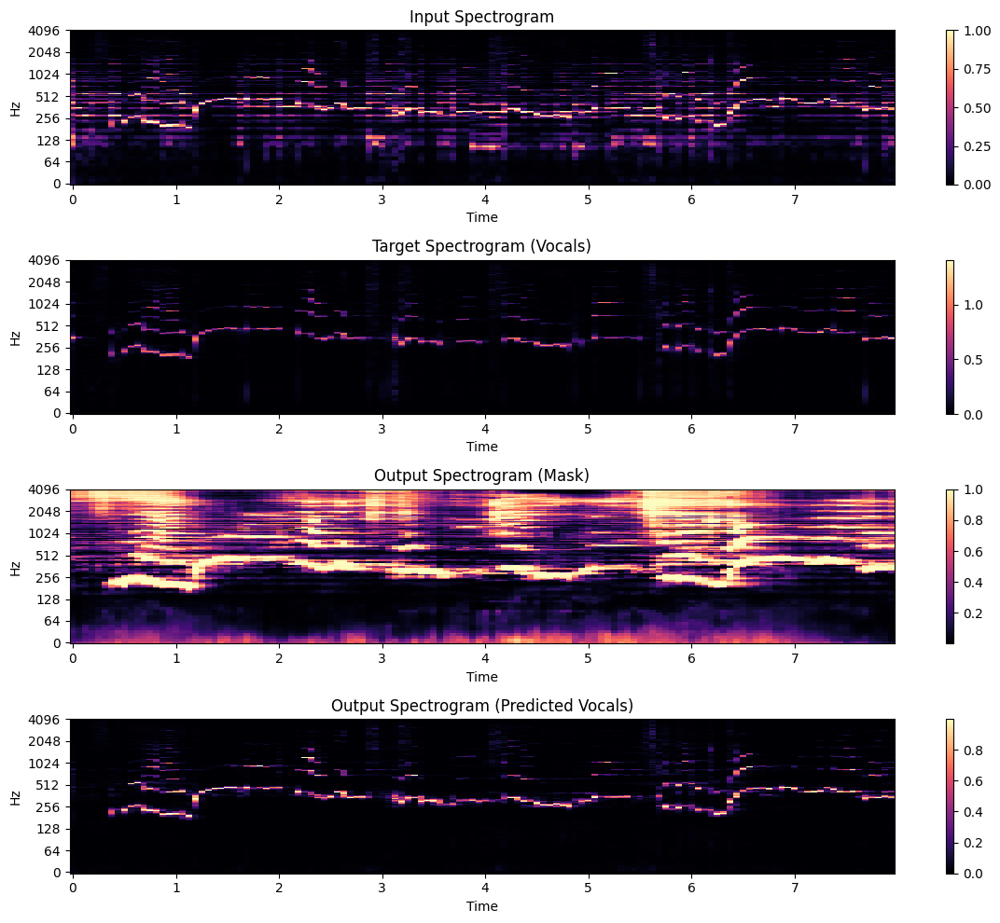

In [121]:
trained, target, mixed = test_result(unet, 10)

### Testing by Ear

#### Extracted Vocals From Model

In [122]:
Audio(trained, rate=8192)

#### Provided Isolated Vocals

In [123]:
Audio(target, rate=8192)

#### Original Mixed Signal

In [124]:
Audio(mixed, rate=8192)

### Using mir_eval for Evaluation of Model

Only computing the score for 10 clips since it takes super long to run for more than 10. The runtime seems to scale exponentially.

In [125]:
from mir_eval.separation import bss_eval_sources

In [126]:
estimates = []
references = []
mixed_signals = []
for idx in range(len(os.listdir('./segmented_data/test/mixtures'))):
    estimate, reference, mixed = test_result(unet, idx, display=False)
    if (np.abs(np.sum(reference)) <= 0.00001):
        continue
    estimates.append(estimate)
    references.append(reference)
    mixed_signals.append(mixed)

estimates = np.array(estimates)
references = np.array(references)
mixed_signals = np.array(mixed_signals)

In [127]:
def sdr(reference, estimate):
    return bss_eval_sources(reference.reshape(1, -1), estimate.reshape(1, -1))[0][0]

In [128]:
n = len(estimates)
vocals_sdrs = np.array([sdr(references[i], estimates[i]) for i in range(n)])
mixtures_sdrs = np.array([sdr(references[i], mixed_signals[i]) for i in range(n)])

In [129]:
nsdrs = vocals_sdrs - mixtures_sdrs

In [130]:
np.mean(nsdrs)

6.463047514372549

### Testing Using a Song of Our Choice

We were curious to try this model on a song that was not in our dataset, and we figured that we could try to challenge it. We chose Fractures by Illenium because it has quite a lot of backing, which could obscure the vocals.

In [57]:
def get_custom_clips(song_name, path, new_sr = 8192, segment_duration = 12):
    x, sr = librosa.load(path + "source/" + song_name, sr=new_sr)
    num_segments = int(len(x) / (segment_duration * sr))
        
    for i in range(num_segments):
        start_sample = i * segment_duration * sr
        end_sample = (i + 1) * segment_duration * sr
        mixture_segment = x[start_sample:end_sample]
        vocal_segment = x[start_sample:end_sample]
        mixture_output_path = os.path.join(path + "segmented", f"{song_name}_segment_{i}.wav")
        sf.write(mixture_output_path, mixture_segment, sr)

In [58]:
get_custom_clips("Fractures - Illenium.mp3", "custom_data/")

In [59]:
def split_song(model, song):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.eval()

    scaler = MinMaxScaler()
    song_scaled = scaler.fit_transform(np.abs(song))
    song_torch = torch.tensor(song_scaled).unsqueeze(0).unsqueeze(0).to(device)

    with torch.no_grad():  # Disable gradient computation
        mask = model(song_torch)

    mask_np = mask.cpu().numpy().squeeze()
    output = mask_np * song_scaled

    if (display):
        # Plot the spectrograms using librosa
        plt.figure(figsize=(12, 10))
    
        plt.subplot(3, 1, 1)
        plt.title('Input Spectrogram')
        librosa.display.specshow(song_scaled, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.subplot(3, 1, 2)
        plt.title('Output Spectrogram (Mask)')
        librosa.display.specshow(mask_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.subplot(3, 1, 3)
        plt.title('Output Spectrogram (Predicted Vocals)')
        librosa.display.specshow(output , sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.tight_layout()
        plt.show()

    iso_vocals = librosa.istft(song * mask_np, hop_length=768, win_length=1024, n_fft=1024)
    mixed_signal = librosa.istft(song, hop_length=768, win_length=1024, n_fft=1024)

    return iso_vocals, mixed_signal

In [60]:
def get_custom_spectrograms(sr=8192):
    mixtures = []
    song_names = os.listdir('custom_data/segmented')
    for song_name in song_names:
        m, _ = librosa.load('custom_data/segmented/' + song_name, sr = sr)
        M = librosa.stft(m, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1]
        mixtures.append(M)
    return np.array(mixtures)

In [61]:
custom_specs = get_custom_spectrograms()

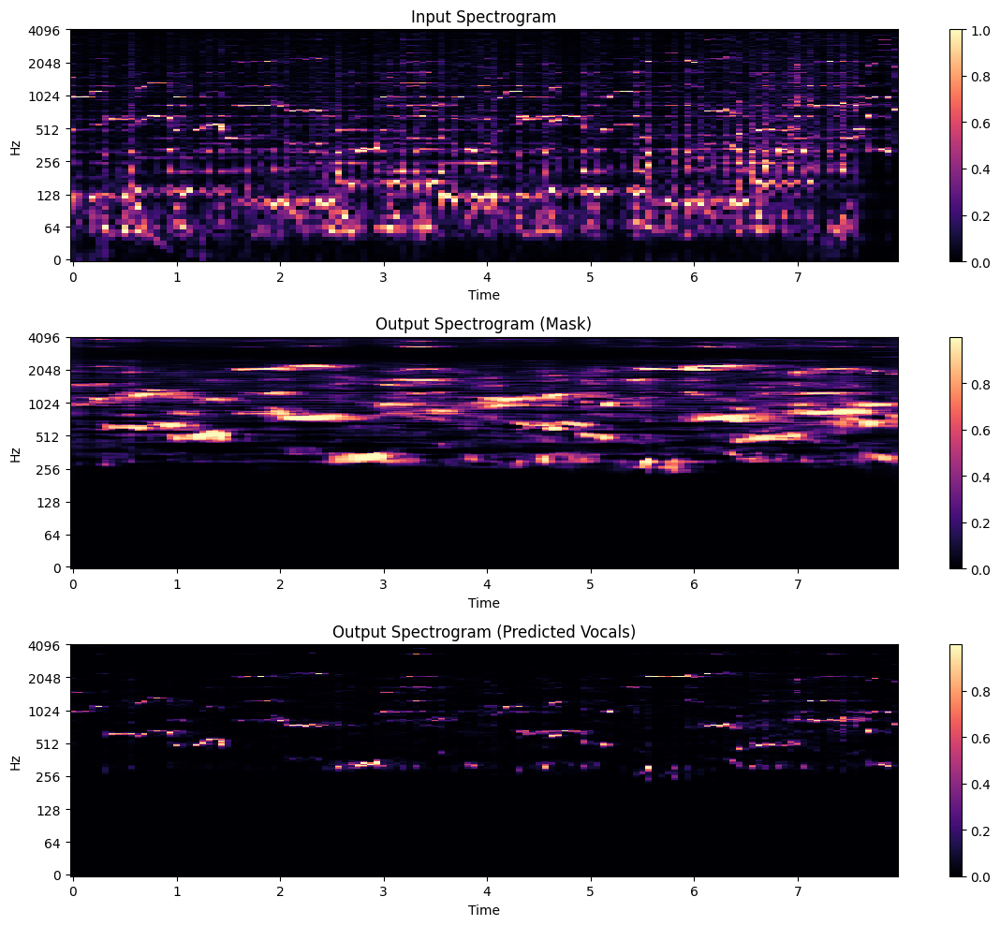

In [62]:
vocals, full_song = split_song(unet, custom_specs[8, :])

#### Extracted Vocals

In [63]:
Audio(vocals, rate=8192)

#### Full Song

In [64]:
Audio(full_song, rate=8192)

This actually sounds quite good! We tried it with several different clips from this and found that the backing was still somewhat present, but the vocals are clear.